### Evaluation of the blind Sangria challenge

In [1]:
from lisacattools.catalog import GWCatalogs, GWCatalogType
from chainconsumer import ChainConsumer
import numpy as np

import corner

import ldc.io.hdf5 as h5io
import pandas as pd
from tqdm import tqdm
import csv
import glob

import lisabeta
import lisabeta.tools.pytools as pytools
from ldc.common.tools import compute_tdi_snr, trigo

from scipy import stats
from scipy.interpolate import InterpolatedUnivariateSpline as spline

import lisabeta
import lisabeta.tools.pytools as pytools
from ldc.common.tools import compute_tdi_snr, trigo
from ldc.waveform.lisabeta import FastBHB
from ldc.common.tools import compute_tdi_snr
from ldc.lisa.noise import get_noise_model
from ldc.common.series import TimeSeries, FrequencySeries, TDI

import seaborn as sns
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.colors as colors
%matplotlib inline

# plt.style.use(['seaborn-ticks','seaborn-deep'])
plt.style.use(['seaborn-v0_8-ticks','seaborn-v0_8-deep'])

# %pylab inline

mpl.rcParams.update({'font.size': 16})
plt.rcParams['axes.grid'] = True
plt.rcParams["figure.figsize"] = (12,7)

%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt

import logging, sys
logging.disable(sys.maxsize)

In [2]:
import lisaconstants as constants

light = constants.C
YRSID_SI = constants.SIDEREALYEAR_J2000DAY*24*60*60
PARSEC_METER = constants.PARSEC_METER
MTsun = constants.GM_SUN/constants.SPEED_OF_LIGHT**3
AU = constants.ASTRONOMICAL_UNIT/light
Gpct = 1.e9*constants.PARSEC_METER/constants.SPEED_OF_LIGHT

### Reading params of the blind MBHBs,

In [3]:
sangria_fl = '/Users/stas/Projects/LISA/ldc2_results/Neil_MBHB/mbhb-unblinded.h5'
mbhb_blind, mbhb_units = h5io.load_array(sangria_fl, name="sky/mbhb/cat")
pd.DataFrame(mbhb_blind)

,EclipticLatitude,EclipticLongitude,PolarAngleOfSpin1,PolarAngleOfSpin2,Spin1,Spin2,Mass1,Mass2,CoalescenceTime,PhaseAtCoalescence,InitialPolarAngleL,InitialAzimuthalAngleL,Redshift,Distance,ObservationDuration,Cadence
0,0.293391,2.278533,0.978407,1.420258,0.913009,0.930043,1.757638e+06,1.300397e+06,6.712405e+06,4.228568,2.824974,0.753334,3.71962,33703.054007,3.155815e+07,3.0
1,0.421998,3.291052,2.168084,2.478092,0.892382,0.570879,1.146532e+06,1.102729e+06,6.818251e+06,3.077585,1.256483,1.657101,2.83462,24363.400645,3.155815e+07,3.0
2,-0.566465,3.400723,0.519261,0.801521,0.985713,0.842326,3.163493e+06,1.541789e+06,1.932406e+07,4.763112,1.520081,5.666303,6.16408,60950.390799,3.155815e+07,3.0
3,0.569821,3.404241,1.906352,2.441202,0.733569,0.933981,1.718933e+06,9.244039e+05,2.240591e+07,2.414134,1.038691,1.643321,2.68262,22800.399640,3.155815e+07,3.0
4,-1.132461,4.815102,0.768653,1.106280,0.555497,0.730661,4.645705e+06,3.845615e+06,2.280142e+07,5.059147,1.478430,2.946762,6.64115,66441.448151,3.155815e+07,3.0
5,-1.099993,5.023376,2.749427,0.627738,0.859547,0.974043,2.551381e+06,8.486769e+05,2.704413e+07,5.903175,1.220335,2.676985,4.86034,46204.728339,3.155815e+07,3.0


In [30]:
def MakeSourceDic(x, name='MBHB'):
    y = {}
    for ii in range(len(x)):
        # print (x.dtype.names[ii])
        y[x.dtype.names[ii]] = x[ii]
    y['m1'] = y['Mass1']/(1+y['Redshift'])
    y['m2'] = y['Mass2']/(1+y['Redshift'])
    
    y = pytools.complete_mass_params(y)
    y["Name"] = name
    
    psi, incl = trigo.aziPolAngleL2PsiIncl(y['EclipticLatitude'], y['EclipticLongitude'], y['InitialPolarAngleL'], y['InitialAzimuthalAngleL'])
    
    y['Inclination'] = incl
    y['Polarization'] = psi
    y['chi1'] = x['Spin1']*np.cos(x['PolarAngleOfSpin1'])
    y['chi2'] = x['Spin2']*np.cos(x['PolarAngleOfSpin2'])
    return (y)

### Evaluate SNR of all sources

0 SN= 972.2993231439159
1 SN= 895.0902677531682
2 SN= 1839.161598382977
3 SN= 859.7607754861091
4 SN= 341.20759648763135
5 SN= 617.5865240150816


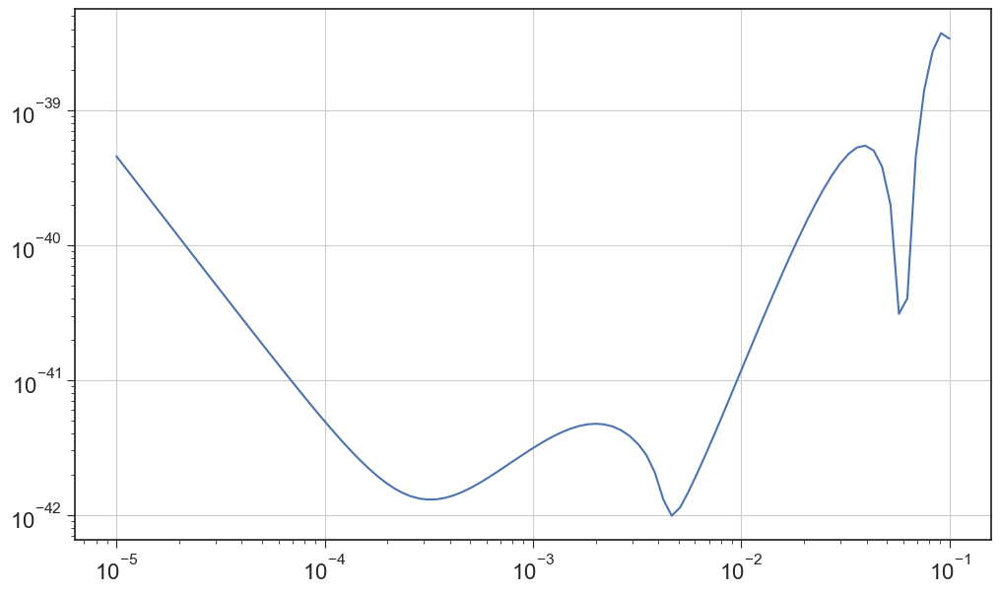

In [25]:
# print (FastBHB)
import ldc
# print (ldc.waveform.lisabeta.fast_bhb.__file__)

Nmodel = get_noise_model('sangria', np.logspace(-5, -1, 100), wd =1)

tmax = 60*60*24*365
dt = 5
df = 1.0/tmax

s_index = 0 # Look at 1st source
SNRs = []
for si in range(len(mbhb_blind)):
    pMBHB = dict(zip(mbhb_blind.dtype.names, mbhb_blind[si]))
    FBH = FastBHB("MBHB", T=tmax, delta_t=dt, approx="IMRPhenomD")

    A,E,T = FBH.get_fd_tdiaet(template=pMBHB)
    AET = TDI(dict(zip(["A", "E", "T"], [A, E, T])))

    snr = np.sqrt(compute_tdi_snr(AET, Nmodel, AET=True, ignore_T=True)["tot2"])
    print (si, 'SN=', snr)
    SNRs.append(snr)


# print (Nmodel.psd(np.logspace(-5, -1, 100)))
plt.loglog(np.logspace(-5, -1, 100), Nmodel.psd(np.logspace(-5, -1, 100)))
plt.show()

In [26]:
print (SNRs)

[972.2993231439159, 895.0902677531682, 1839.161598382977, 859.7607754861091, 341.20759648763135, 617.5865240150816]


In [31]:
flsN = glob.glob('/Users/stas/Projects/LISA/ldc2_results/Neil_MBHB/sangria_bh/*.dat')
print (len(flsN))
chns = []
for fl in flsN:
    chn = np.genfromtxt(fl)
    print (chn.shape)
    chns.append(chn[:, 2:])

6
(700000, 13)
(790000, 13)
(700000, 13)
(790000, 13)
(750000, 13)
(790000, 13)


In [60]:
# iteration, logL, m1, m2, chi1, chi2, phi_c, t_c, D_L, cos(ecliptic co-lat), ecliptic longitude, 
# polarization, cos(inclination)
lbls = ['m1', 'm2', 'chi1', 'chi2', 'phi', 'Tc', 'DL', 'sbet', 'lam', 'psi', 'ciota']
print (chns[0].shape)

Tcs = []
for si in range(len(chns)):
    Tcs.append(np.mean(chns[si][::10, 5]))
# print (Tcs)
ind_srt = np.argsort(Tcs)
print (ind_srt)

trSrcs = []
for ind in range(len(mbhb_blind)):
    cs = MakeSourceDic(mbhb_blind[ind])
    trSrcs.append(cs)
#     print (ind, cs['CoalescenceTime'])



(700000, 11)
[2 3 5 4 1 0]


### Plotting the chains:

MBHB# 0


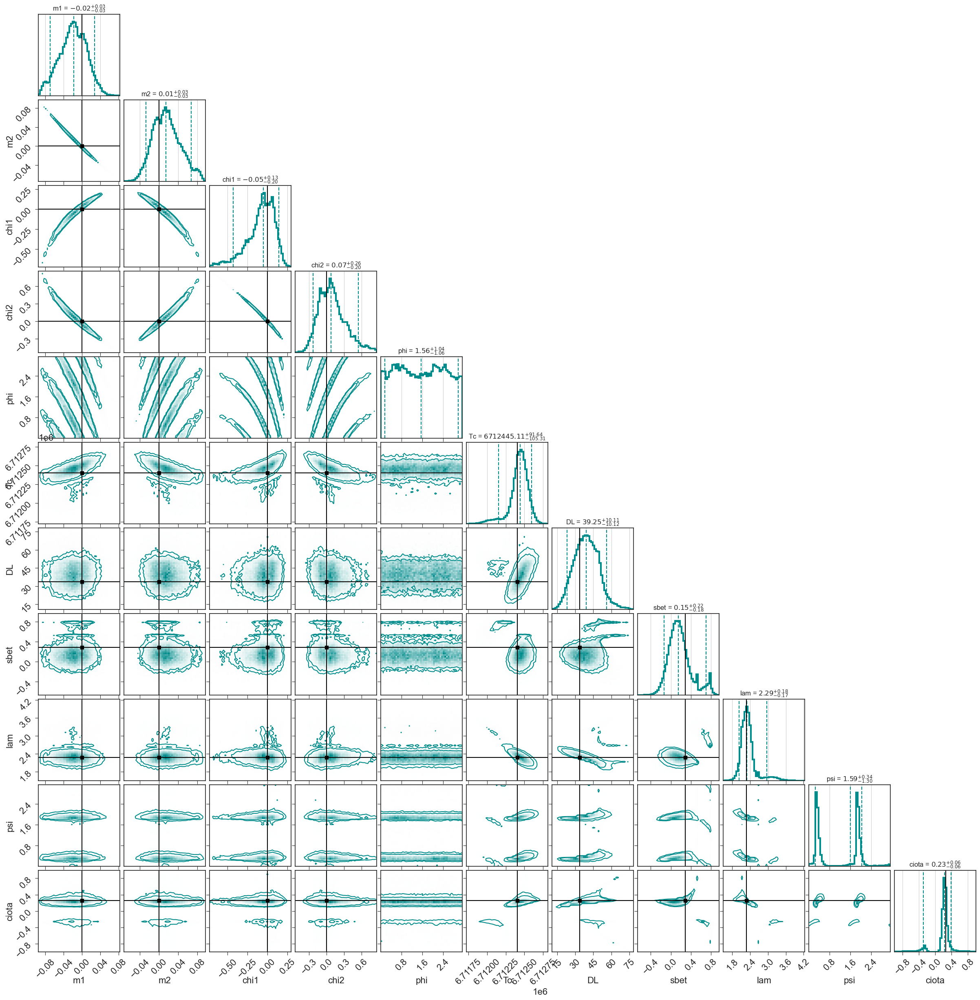

MBHB# 1


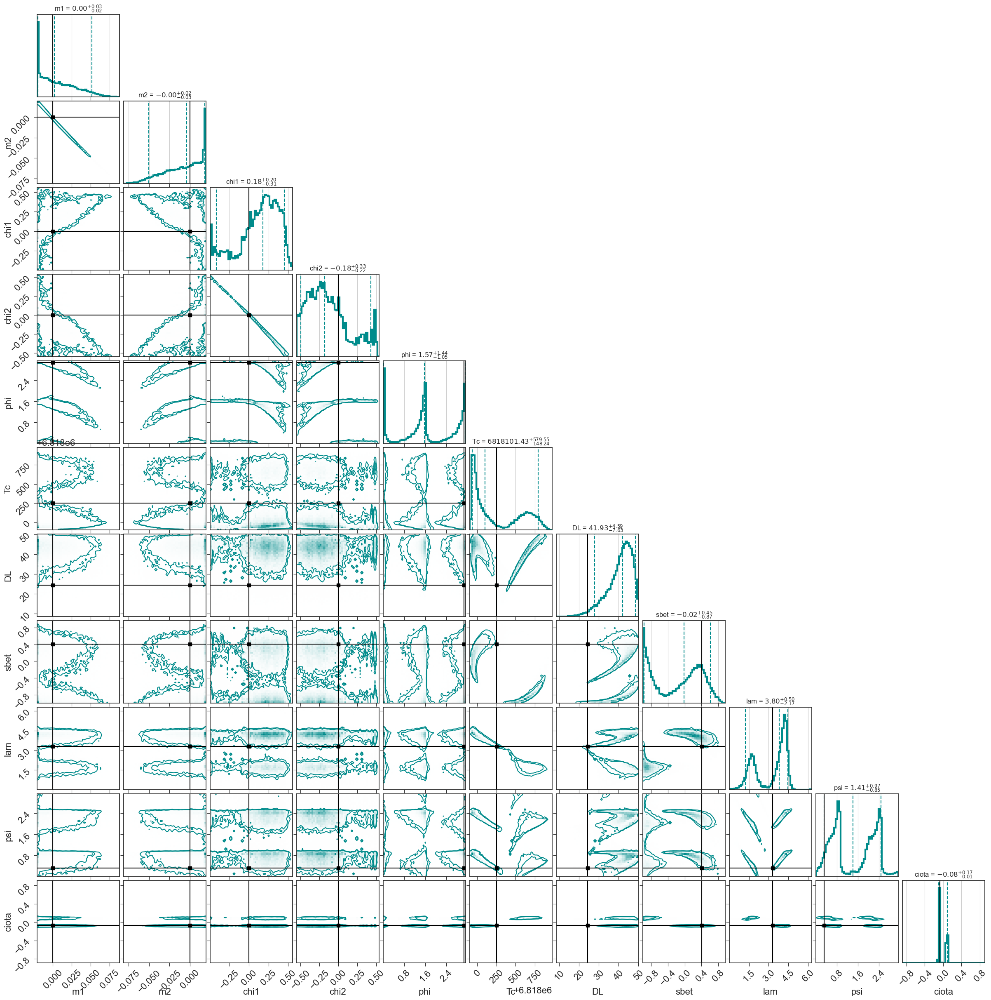

MBHB# 2


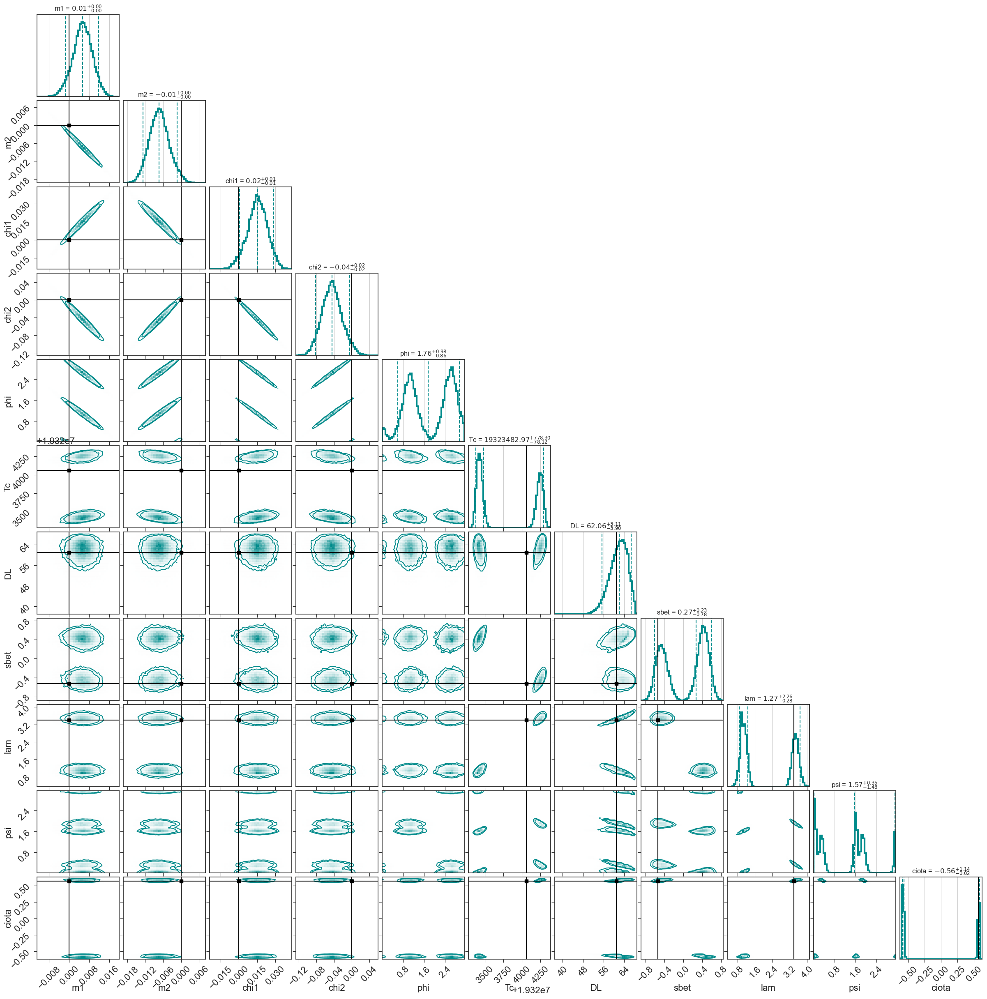

MBHB# 3


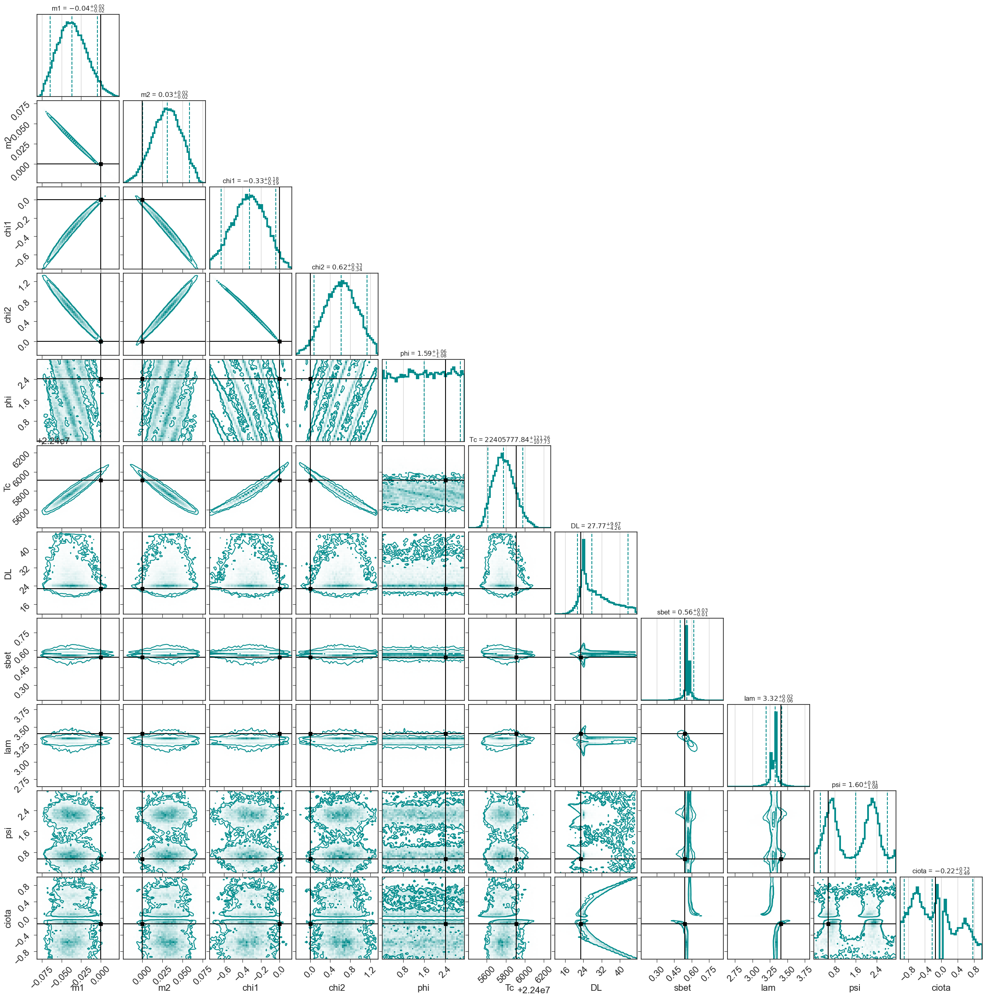

MBHB# 4


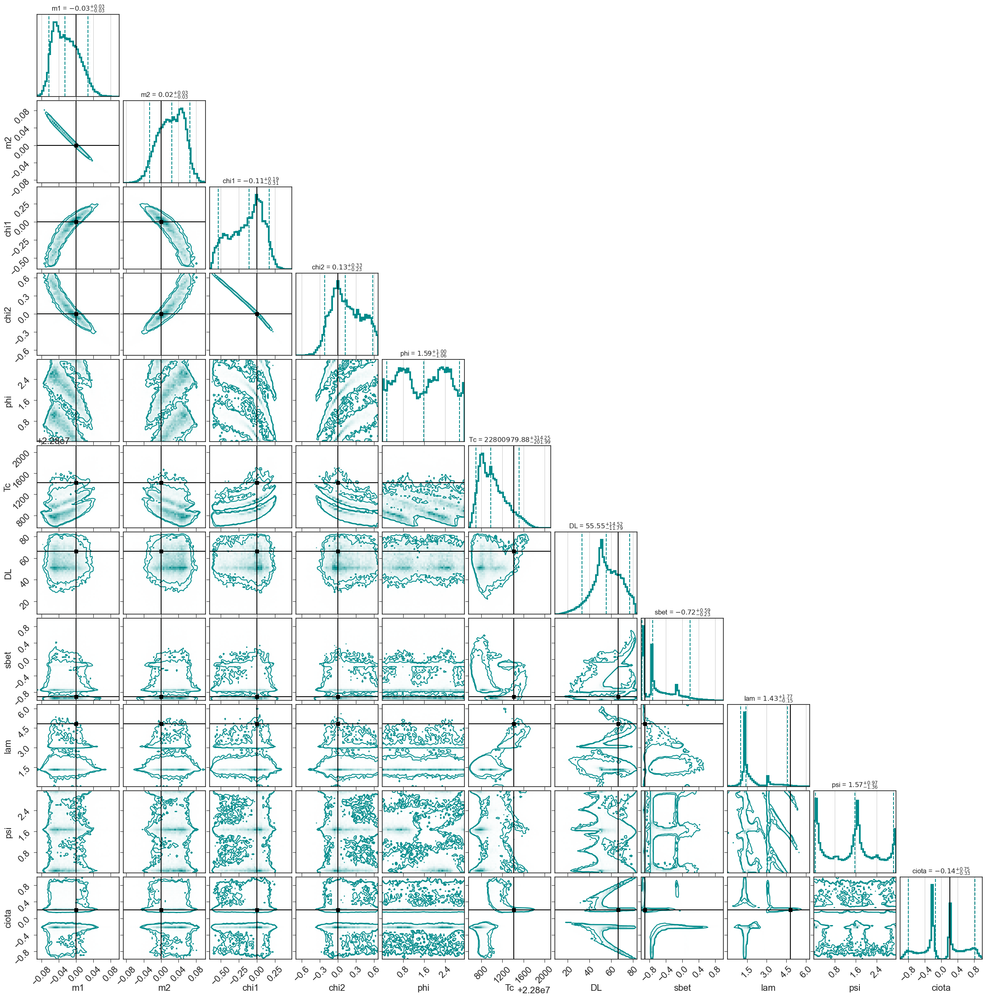

MBHB# 5


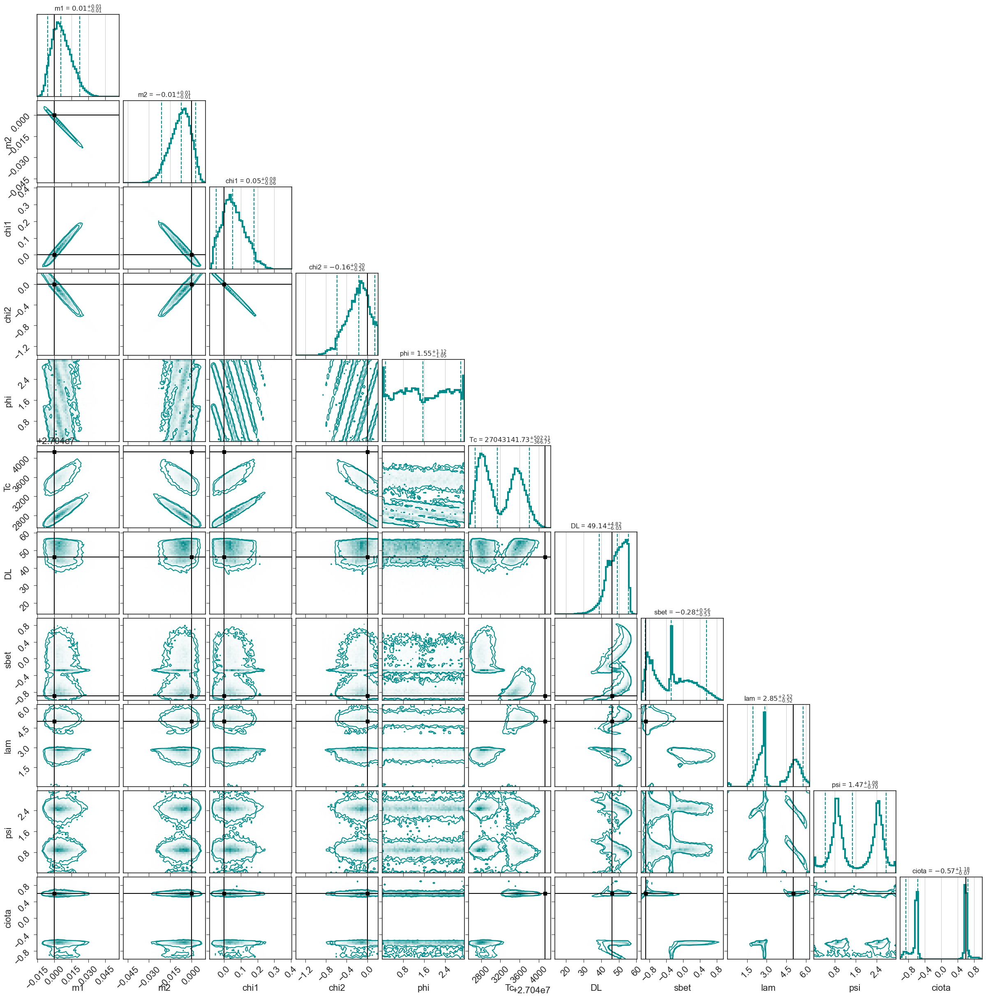

In [74]:
for ind in range(len(mbhb_blind)):
    trS = makeTr(ind)
    z0 = z_at_value(Planck18.luminosity_distance, trS[6] * un.Gpc )
    trS[0] = trS[0]*(1+z0)
    trS[1] = trS[1]*(1+z0)
    chn = chns[ind_srt[ind]]
    
    dt2Pl = np.copy(chn)
    dt2Pl[:, 0] = (dt2Pl[:, 0] - trS[0])/trS[0]
    dt2Pl[:, 1] = (dt2Pl[:, 1] - trS[1])/trS[1]
    dt2Pl[:, 2] = (dt2Pl[:, 2] - trS[2])
    dt2Pl[:, 3] = (dt2Pl[:, 3] - trS[3])
    
    trS[0] = 0.
    trS[1] = 0.
    trS[2] = 0.
    trS[3] = 0.
    
    print ('MBHB#', ind)
    fig = corner.corner(dt2Pl[::10, :],  bins=50, hist_kwargs={'density':True, 'lw':3}, 
                    plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
                    show_titles=True, color='darkcyan', truths=trS, truth_color='k', use_math_test=True,
                    levels=[0.8, 0.9], title_kwargs={"fontsize": 12}, labels=lbls)
    plt.show()
    
    

[ 3.72411000e+05  2.75530000e+05  5.09774183e-01  1.39478556e-01
  4.22856809e+00  6.71240450e+06  3.37030540e+01  2.89199941e-01
  2.27853319e+00 -1.24272195e+00  2.61239420e-01]
Tc 6712428.541357957
m1 1726459.7527992309 372411.0
m2 1323262.9300705125 275530.0
DL 39.456501811677505 33.7030540067839
z=  [3.59973369 4.00508131 3.70885879 ... 3.92556065 4.59547681 4.06034572] redshift
[8096070.08878084 8809529.37024899 8288143.0400077  ... 8669563.70224089
 9848694.60908625 8906801.20113876] [5989914.88318493 6517771.03088981 6132020.94410026 ... 6414216.78435501
 7286602.23688757 6589738.0446597 ]


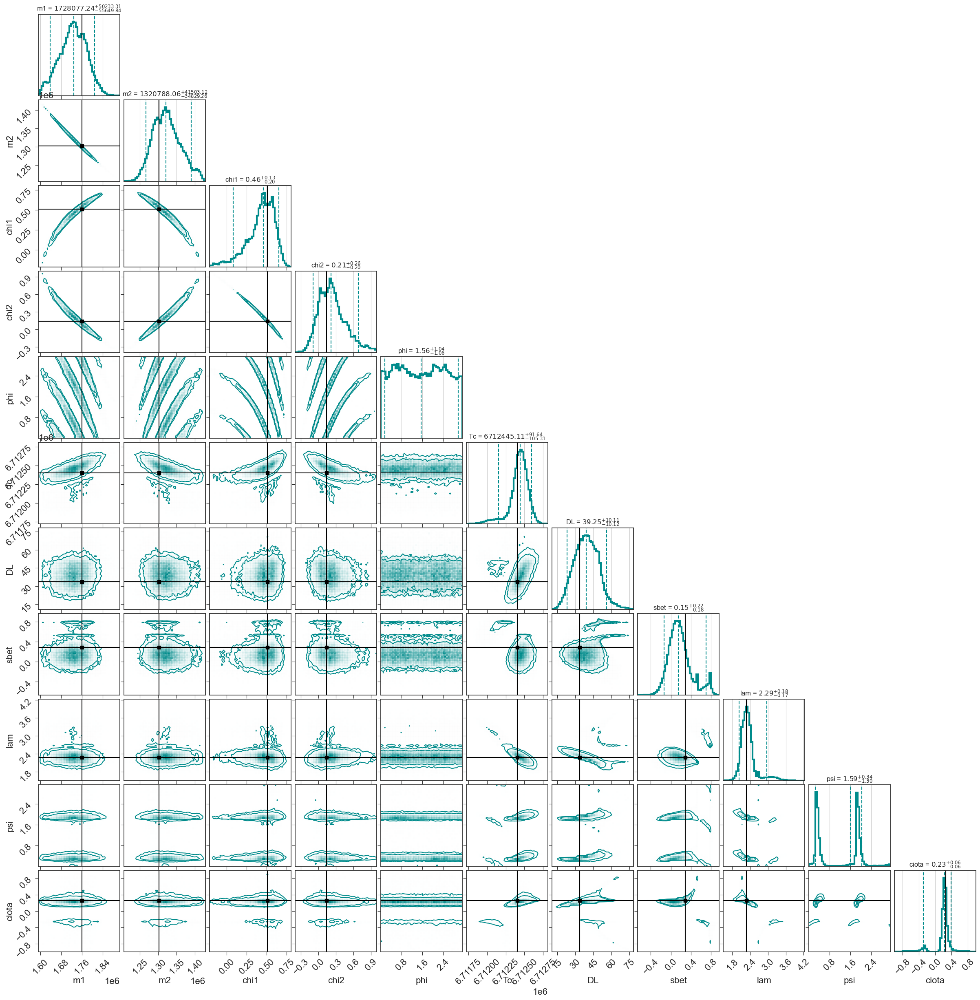

In [72]:
ind = 0
# cat_src = mbhb_blind[ind]
# print (cat_src)
# tru_src = MakeSourceDic(cat_src)
# print (tru_src)
def makeTr(ind):
    cs = MakeSourceDic(mbhb_blind[ind])
    trs = [cs['m1'], cs['m2'], cs['chi1'], cs['chi2'], cs['PhaseAtCoalescence'],\
           cs['CoalescenceTime'], cs['Distance']*1.e-3, np.sin(cs['EclipticLatitude']), \
           cs['EclipticLongitude'], cs['Polarization'], np.cos(cs['Inclination'])]
#     print ('Tc = ', cs['CoalescenceTime'])
    return (np.array(trs))

trS = makeTr(ind)    

print (trS)

print ('Tc', np.mean(chns[ind_srt[ind]][::10, 5]))
print ('m1', np.mean(chns[ind_srt[ind]][::10, 0]), trS[0])
print ('m2', np.mean(chns[ind_srt[ind]][::10, 1]), trS[1])
print ('DL', np.mean(chns[ind_srt[ind]][::10, 6]), trS[6])

from astropy.cosmology import Planck18, z_at_value
import astropy.units as un

# z = z_at_value(Planck18.luminosity_distance, chns[ind_srt[ind]][::10, 6] * un.Gpc )
z0 = z_at_value(Planck18.luminosity_distance, trS[6] * un.Gpc )
trS[0] = trS[0]*(1+z0)
trS[1] = trS[1]*(1+z0)

print ('z= ', z)
print (trS[0]*(1+z), trS[1]*(1.+z))
# print (trS[0]/np.mean(chns[ind_srt[ind]][::10, 0]), trS[1]/np.mean(chns[ind_srt[ind]][::10, 1]))

fig = corner.corner(chns[2][::10, :],  bins=50, hist_kwargs={'density':True, 'lw':3}, 
                    plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
                    show_titles=True, color='darkcyan', truths=trS, truth_color='k', use_math_test=True,
                    levels=[0.8, 0.9], title_kwargs={"fontsize": 12}, labels=lbls)

# NEED to associate the source

In [75]:
def CI1D(x, xtr):
    sor_x = np.sort(x)
    indx0 = np.argwhere(sor_x >= xtr)[0][0]
    qnt = indx0/len(sor_x)
    alp = 1.0-qnt
    if (alp > 0.5):
        alp = qnt
    
    cix = 1 - 2.*alp
    pltit = False
    if pltit:
        H, xedges = np.histogram(x, bins=200,density=True)
        plt.plot(xedges[1:], np.cumsum(H))
        plt.grid(True)
        plt.show()
        ### check the above number
        cdf = np.cumsum(H)
        cdf_spl = spline(xedges[1:], cdf/cdf[-1])
        print ('check it', 1 - 2.*cdf_spl(xtr))
    return (cix)

def FindCI(x, y, Nbins, Pnt, lbls, pltC=False):
    
    xtr = Pnt[0]
    ytr = Pnt[1]
    H, xedges, yedges = np.histogram2d(x, y, bins=Nbins, density=True)
    dx= np.diff(xedges)[0]
    dy= np.diff(yedges)[0]
    ### find the bin and value of H where true belongs to
    xi = np.where(xedges>= xtr)[0][0]-1
    yi = np.where(yedges>= ytr)[0][0]-1
    
    Hflat = H.flatten()
    cis = []
    iabove = np.argwhere(Hflat >= H[xi, yi] )[:,0]
    cis.append(np.sum(Hflat[iabove])*dx*dy)
    iabove = np.argwhere(Hflat >= H[xi+1, yi+1] )[:,0]
    cis.append(np.sum(Hflat[iabove])*dx*dy)
    iabove = np.argwhere(Hflat >= H[xi+1, yi] )[:,0]
    cis.append(np.sum(Hflat[iabove])*dx*dy)
    iabove = np.argwhere(Hflat >= H[xi, yi+1] )[:,0]
    cis.append(np.sum(Hflat[iabove])*dx*dy)
    
    
    ci = np.mean(np.array(cis))
    ci_m = min(cis)
    ci_p =max(cis)
    if (ci>=0.7 and pltC):
#         pltC = True
#     if (pltC):
        rng = (0.95, 0.95)
#         rng = (0.99, 0.99)
        
        corner.corner(np.array([x, y]).T,  bins=50, hist_kwargs={'density':True, 'lw':3}, 
                    plot_datapoints=False, fill_contours=False, quantiles=[0.05, 0.5, 0.95],
                    show_titles=True, color='darkcyan', truths=Pnt, truth_color='r', use_math_test=True,
                    levels=[ci, 0.9], title_kwargs={"fontsize": 12}, labels=lbls)#,\
#                     range = rng)
        plt.show()
    ### compute marginalized 1d CI
    cix = CI1D(x, xtr)
    ciy = CI1D(y, ytr)
    
    return (np.array([ci, ci_m, ci_p]), cix, ciy)
        

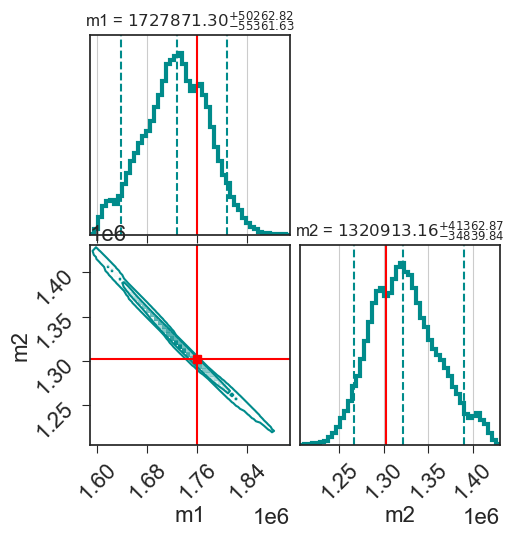

(array([0.99613679, 0.98631   , 1.        ]), 0.45497999999999994, 0.3805685714285715)


In [77]:
# lbls = ['m1', 'm2', 'chi1', 'chi2', 'phi', 'Tc', 'DL', 'sbet', 'lam', 'psi', 'ciota']

ind = 0
trS = makeTr(ind)
z0 = z_at_value(Planck18.luminosity_distance, trS[6] * un.Gpc )
trS[0] = trS[0]*(1+z0)
trS[1] = trS[1]*(1+z0)
chn = chns[ind_srt[ind]]
x1 = chn[:, 0]
x2 = chn[:, 1]
lbl = ['m1', 'm2']
ci = FindCI(x1, x2, 150, [trS[0], trS[1]], lbl, pltC=True) 

print (ci)

In [82]:
# lbls = ['m1', 'm2', 'chi1', 'chi2', 'phi', 'Tc', 'DL', 'sbet', 'lam', 'psi', 'ciota']

ind = 0
check_lbls = [['m1', 'm2'], ['chi1', 'chi2'], ['m1', 'chi1'],['sbet', 'lam'], ['ciota', 'DL']] 
check_inds = [[0,1], [2,3], [0,2], [7,8], [10,6]]

def ReportCI(ind):
    report = 'MBHB'+str(ind) + ': \n'
    chn = chns[ind_srt[ind]]
    for ii, lbl in enumerate(check_lbls):
        rec = ''
        print (ii, lbl)
        i1, i2 = check_inds[ii]
        trS = makeTr(ind)
        z0 = z_at_value(Planck18.luminosity_distance, trS[6] * un.Gpc )
        trS[0] = trS[0]*(1+z0)
        trS[1] = trS[1]*(1+z0)

        x1 = chn[:, i1]
        x2 = chn[:, i2]

        ci = FindCI(x1, x2, 150, [trS[i1], trS[i2]], lbl, pltC=True) 

        rec += lbl[0] + " - " + lbl[1] + \
        f' CI 2D->{ci[0][0]:.2f}({ci[0][1]:.2f},{ci[0][2]:.2f}), 1D->{ci[1]: .2f}, {ci[2]: .2f} \n'

        report += rec

    #     print (rec)

    return (report)

0 ['m1', 'm2']


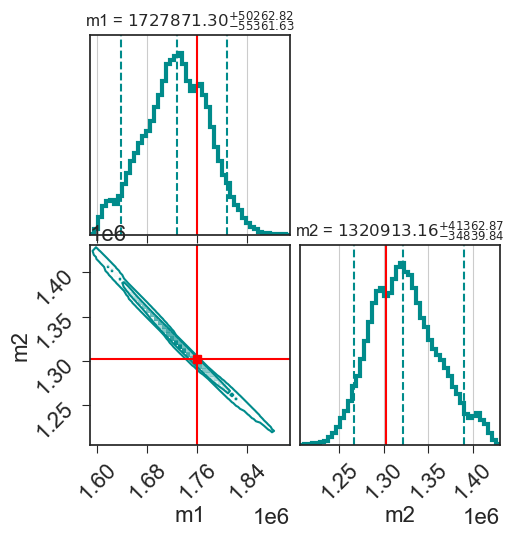

1 ['chi1', 'chi2']
2 ['m1', 'chi1']
3 ['sbet', 'lam']
4 ['ciota', 'DL']


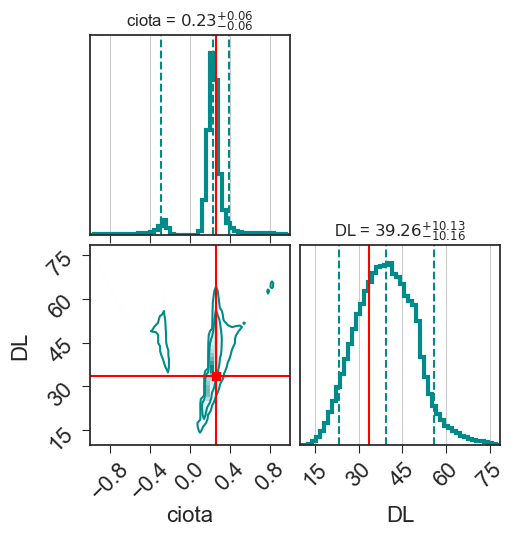

MBHB0: 
m1 - m2 CI 2D->1.00(0.99,1.00), 1D-> 0.45,  0.38 
chi1 - chi2 CI 2D->0.61(0.09,1.00), 1D-> 0.28,  0.27 
m1 - chi1 CI 2D->0.66(0.55,0.78), 1D-> 0.45,  0.28 
sbet - lam CI 2D->0.35(0.27,0.41), 1D-> 0.51,  0.06 
ciota - DL CI 2D->0.71(0.66,0.75), 1D-> 0.44,  0.40 



In [83]:
print (ReportCI(0))

0 ['m1', 'm2']


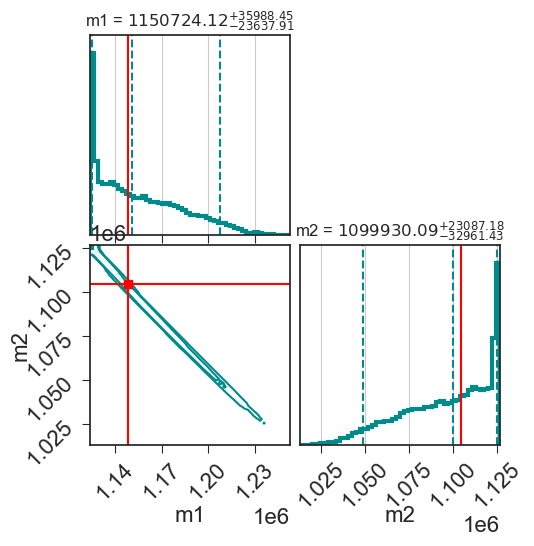

1 ['chi1', 'chi2']
2 ['m1', 'chi1']
3 ['sbet', 'lam']


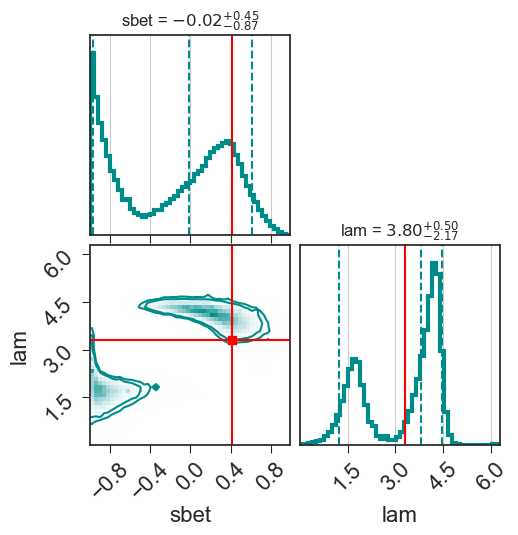

4 ['ciota', 'DL']


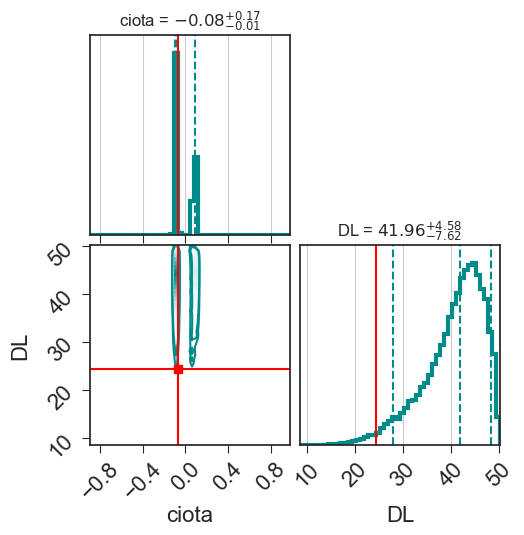

MBHB1: 
m1 - m2 CI 2D->0.99(0.95,1.00), 1D-> 0.06,  0.11 
chi1 - chi2 CI 2D->0.42(0.22,0.66), 1D-> 0.49,  0.47 
m1 - chi1 CI 2D->0.66(0.51,0.84), 1D-> 0.06,  0.49 
sbet - lam CI 2D->0.83(0.78,0.87), 1D-> 0.64,  0.23 
ciota - DL CI 2D->0.97(0.95,0.99), 1D-> 0.23,  0.96 



In [84]:
print (ReportCI(1))

0 ['m1', 'm2']


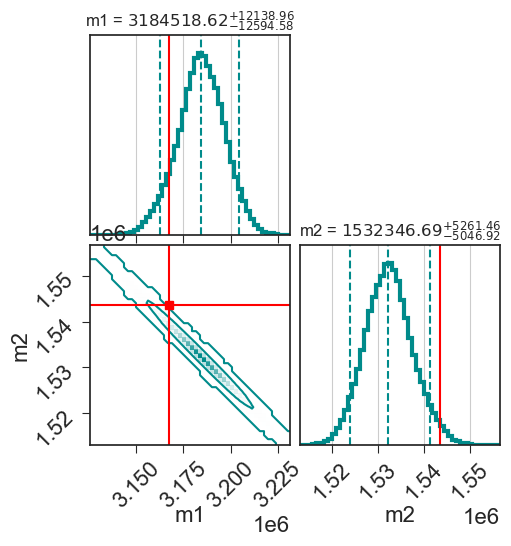

1 ['chi1', 'chi2']


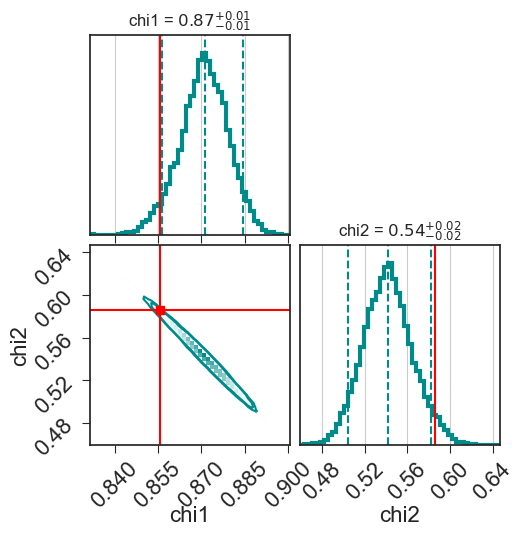

2 ['m1', 'chi1']


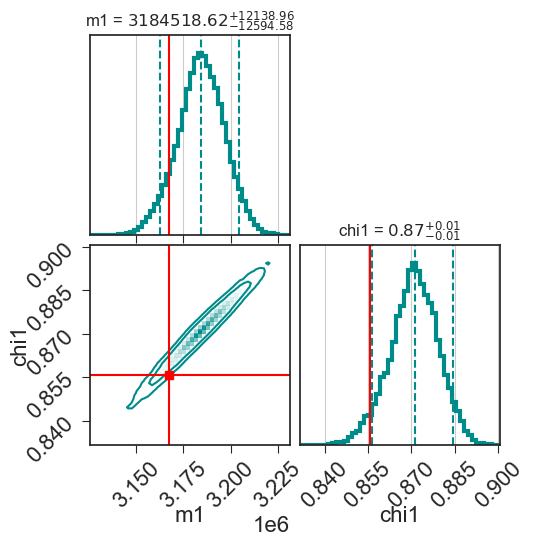

3 ['sbet', 'lam']
4 ['ciota', 'DL']
MBHB2: 
m1 - m2 CI 2D->1.00(1.00,1.00), 1D-> 0.81,  0.96 
chi1 - chi2 CI 2D->0.95(0.91,0.97), 1D-> 0.91,  0.92 
m1 - chi1 CI 2D->0.99(0.98,1.00), 1D-> 0.81,  0.91 
sbet - lam CI 2D->0.29(0.26,0.33), 1D-> 0.75,  0.40 
ciota - DL CI 2D->0.52(0.33,0.71), 1D-> 0.25,  0.23 



In [85]:
print (ReportCI(2))

0 ['m1', 'm2']


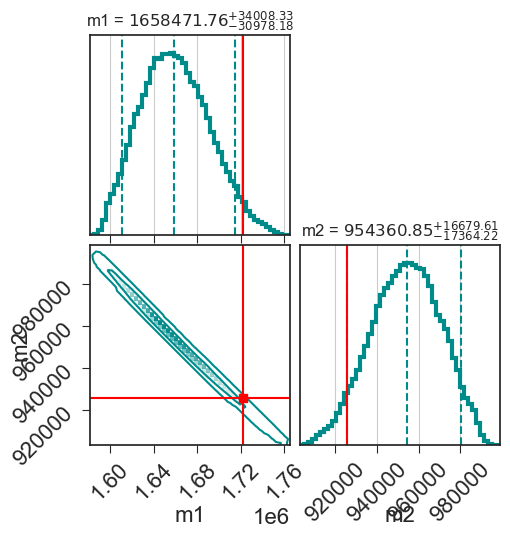

1 ['chi1', 'chi2']


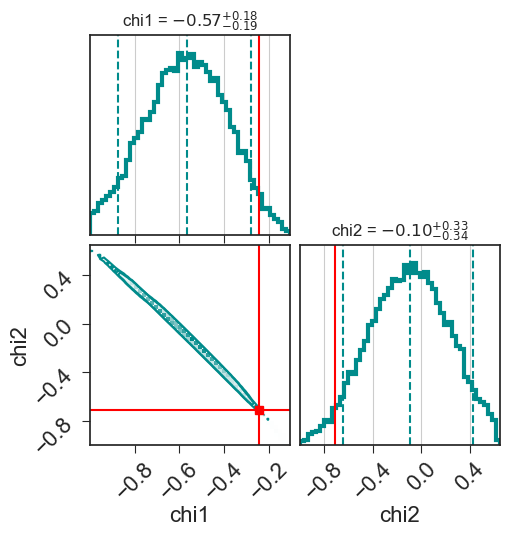

2 ['m1', 'chi1']


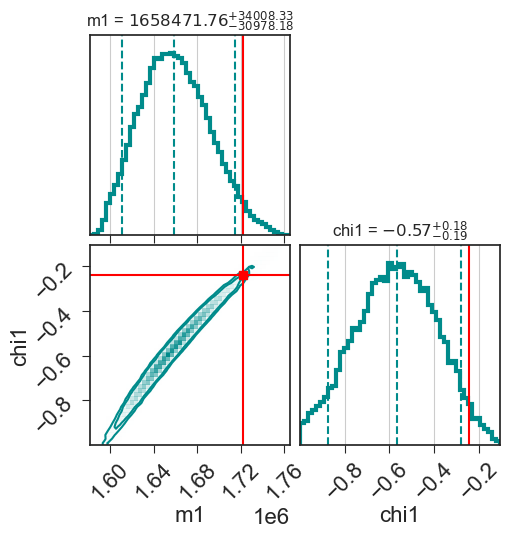

3 ['sbet', 'lam']


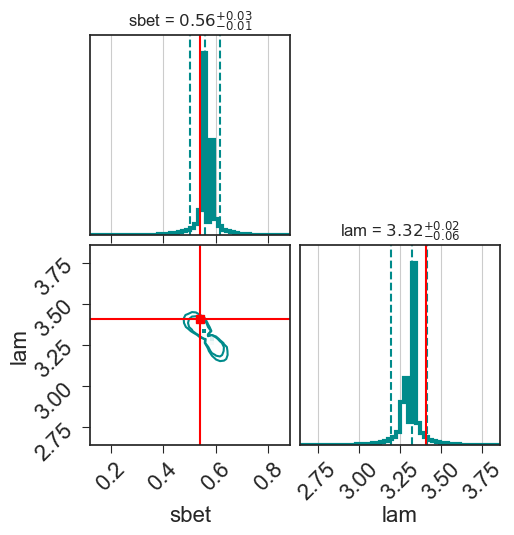

4 ['ciota', 'DL']
MBHB3: 
m1 - m2 CI 2D->1.00(1.00,1.00), 1D-> 0.94,  0.90 
chi1 - chi2 CI 2D->0.93(0.81,1.00), 1D-> 0.94,  0.94 
m1 - chi1 CI 2D->0.83(0.80,0.85), 1D-> 0.94,  0.94 
sbet - lam CI 2D->0.86(0.86,0.87), 1D-> 0.76,  0.88 
ciota - DL CI 2D->0.59(0.55,0.64), 1D-> 0.11,  0.79 



In [86]:
print (ReportCI(3))

0 ['m1', 'm2']
1 ['chi1', 'chi2']
2 ['m1', 'chi1']
3 ['sbet', 'lam']


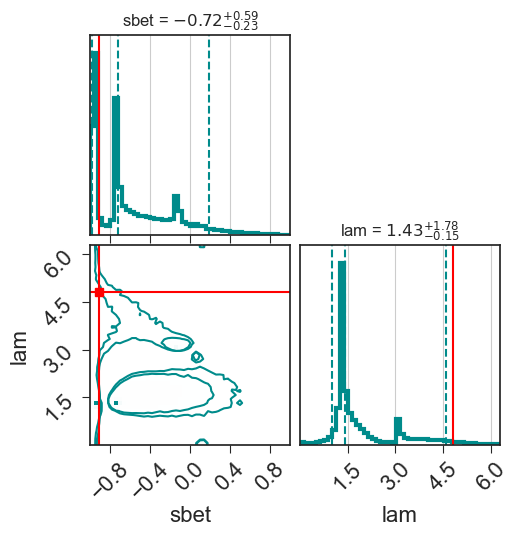

4 ['ciota', 'DL']
MBHB4: 
m1 - m2 CI 2D->0.62(0.41,0.80), 1D-> 0.53,  0.52 
chi1 - chi2 CI 2D->0.14(0.02,0.45), 1D-> 0.36,  0.37 
m1 - chi1 CI 2D->0.10(0.05,0.14), 1D-> 0.53,  0.36 
sbet - lam CI 2D->0.81(0.75,0.84), 1D-> 0.37,  0.92 
ciota - DL CI 2D->0.38(0.12,0.62), 1D-> 0.23,  0.53 



In [87]:
print (ReportCI(4))

0 ['m1', 'm2']


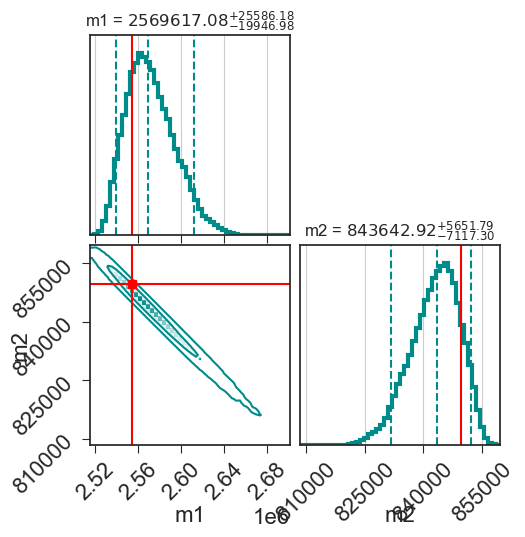

1 ['chi1', 'chi2']
2 ['m1', 'chi1']
3 ['sbet', 'lam']
4 ['ciota', 'DL']
MBHB5: 
m1 - m2 CI 2D->1.00(1.00,1.00), 1D-> 0.53,  0.72 
chi1 - chi2 CI 2D->0.36(0.08,0.69), 1D-> 0.59,  0.57 
m1 - chi1 CI 2D->0.18(0.10,0.26), 1D-> 0.53,  0.59 
sbet - lam CI 2D->0.25(0.17,0.35), 1D-> 0.89,  0.40 
ciota - DL CI 2D->0.57(0.40,0.75), 1D-> 0.61,  0.35 



In [88]:
print (ReportCI(5))